In [1]:
import pandas as pd
import numpy as np
import os
import datetime as dt
import calendar
from matplotlib import pyplot as plt
import scipy.stats as stats

In [78]:
year = 2019

# df_spot= pd.read_csv(f'/Users/yusuke_miyazaki/Desktop/OneDrive/研究関連データ/JEPX_tradedata/spot_{year}.csv',encoding='Shift-JIS')
# df_jikanmae = pd.read_csv(f'/Users/yusuke_miyazaki/Desktop/OneDrive/研究関連データ/JEPX_tradedata/im_trade_summary_{year}.csv',encoding='Shift-JIS')
df_spot=pd.read_csv(f'../../卒論関連書類/データ/spot_{year}.csv',encoding='Shift-JIS')
df_jikanmae = pd.read_csv(f'../../卒論関連書類/データ/im_trade_summary_{year}.csv',encoding='Shift-JIS')


In [66]:
# DATE_TIMEの列を追加
# カラム名がDateとtimecode
def Create_Date_timecode(df):
    df = df.copy()
    Date_list = df['Date'].values
    Time_code = df['timecode'].values
    # 年月日と時刻コードを連結して
    Date_time_list = []
    for i in range(len(df)):
        Date_time = f'{Date_list[i]}_{Time_code[i]}'
        Date_time_list.append(Date_time)

    # df['Datetimes'] = Date_time_list
    df['DATE_timecode'] = Date_time_list
    return(df)

# カラム名がDateとTime
def Create_DateTime2(df):
    Date_Time_list = []
    Date_list = df['Date'].values
    Time_list = df['Time'].values
    for i in range(len(df)):
        Date = Date_list[i]
        Time = Time_list[i]
        str_datetime = f'{Date} {Time}'
        Date_Time_list.append(str_datetime)
    df['DATE_TIME'] = Date_Time_list

    return(df)


In [67]:
# スポット市場の約定量とシステムプライス
df_spot = df_spot.rename(columns={'システムプライス(円/kWh)':'spot_price',
                        '約定総量(kWh)':'volume_spot','年月日':'Date','時刻コード':'timecode'})

df_jikanmae = df_jikanmae.rename(columns={'平均（円/kWh）':'jikanmae_price',
                        '約定量合計（MWh/h）':'volume_jikanmae','年月日':'Date','時刻コード':'timecode'})

df_spot = Create_Date_timecode(df_spot)
df_jikanmae =Create_Date_timecode(df_jikanmae)


# DATE_timecode を軸として二つのdataframeを連結
df_merge = df_spot.merge(df_jikanmae,on='DATE_timecode')

# JEPXの値差の列を追加
df_merge['gap_price'] = df_merge['jikanmae_price'] - df_merge['spot_price']

In [68]:
# スポット市場の約定量とシステムプライス
df_spot = df_spot.rename(columns={'システムプライス(円/kWh)':'spot_price',
                        '約定総量(kWh)':'volume_spot','年月日':'Date','時刻コード':'timecode'})

df_jikanmae = df_jikanmae.rename(columns={'平均（円/kWh）':'jikanmae_price',
                        '約定量合計（MWh/h）':'volume_jikanmae','年月日':'Date','時刻コード':'timecode'})

df_spot = Create_Date_timecode(df_spot)
df_jikanmae =Create_Date_timecode(df_jikanmae)


# DATE_timecode を軸として二つのdataframeを連結
df_merge = df_spot.merge(df_jikanmae,on='DATE_timecode')

# JEPXの値差の列を追加
df_merge['gap_price'] = df_merge['jikanmae_price'] - df_merge['spot_price']

In [69]:
df_merge['gap_percent'] =  df_merge['jikanmae_price'] / df_merge['spot_price']

In [70]:
gap_percent = df_merge['gap_percent'].values*100

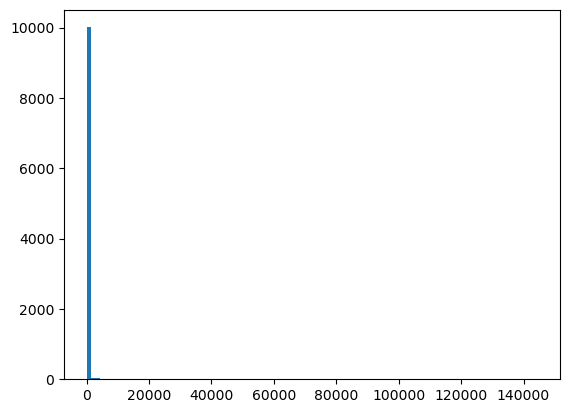

In [71]:
plt.hist(gap_percent,bins=100)
plt.show()

In [72]:
len(gap_percent[gap_percent>1000])

458

2022


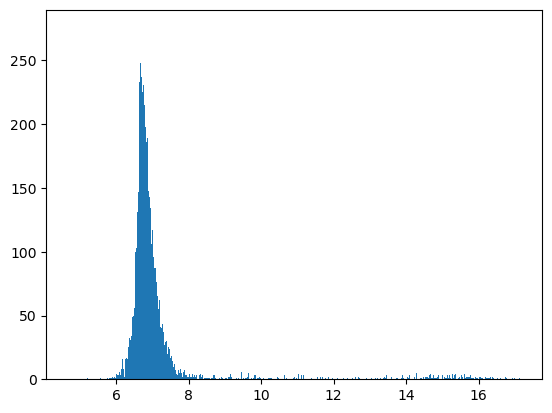

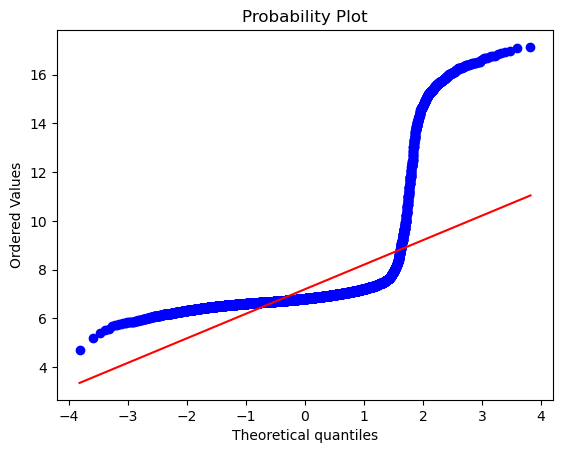

In [73]:
print(f'{year}')

plt.hist(np.log2(gap_percent),bins=1000)
plt.show()

stats.probplot(np.log2(gap_percent), dist="norm" , plot=plt)

plt.show()

In [ ]:
# ここから1日毎のプロット

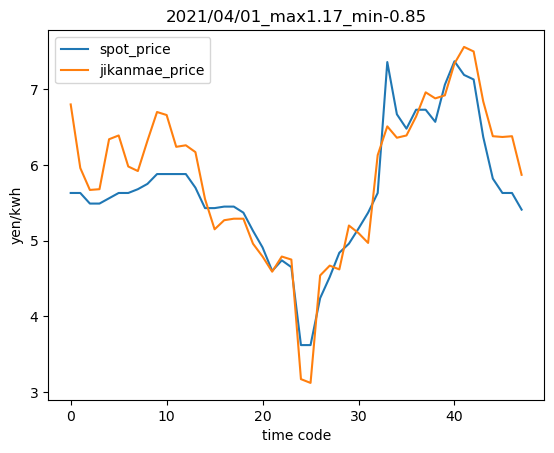

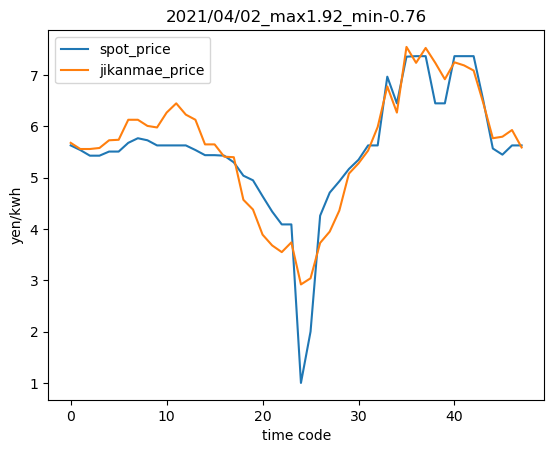

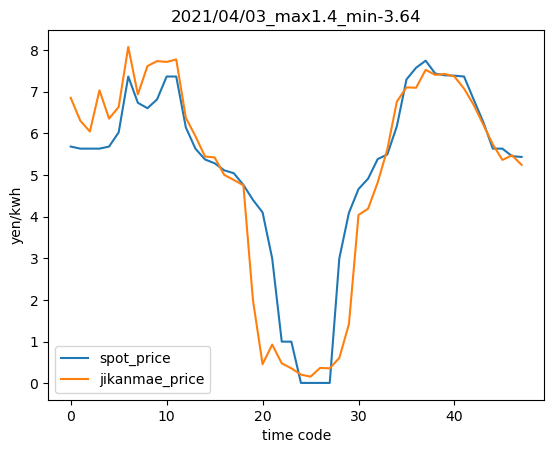

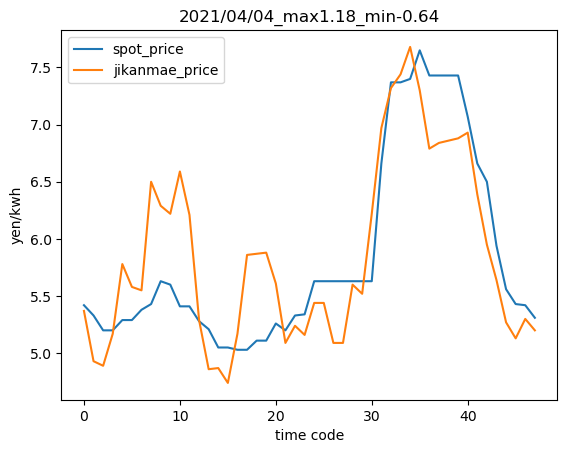

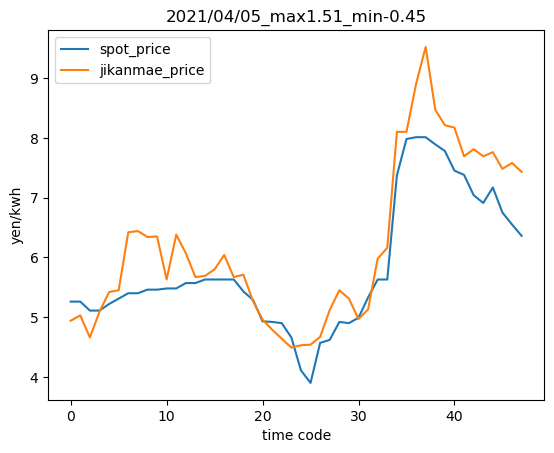

...

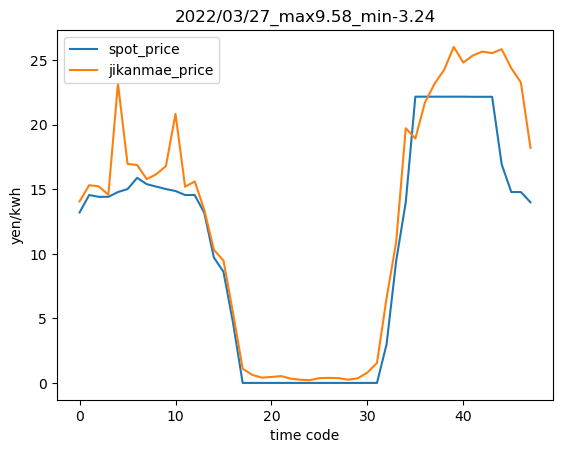

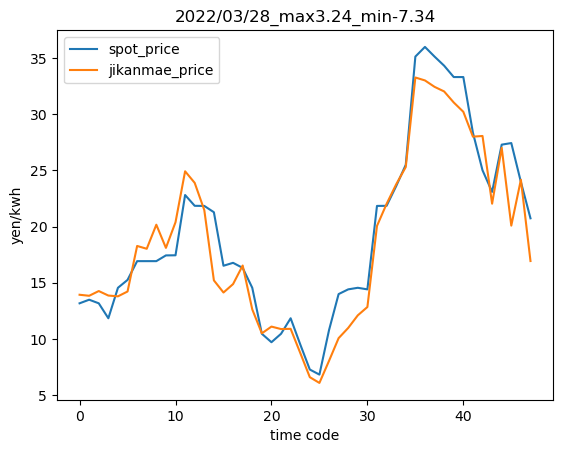

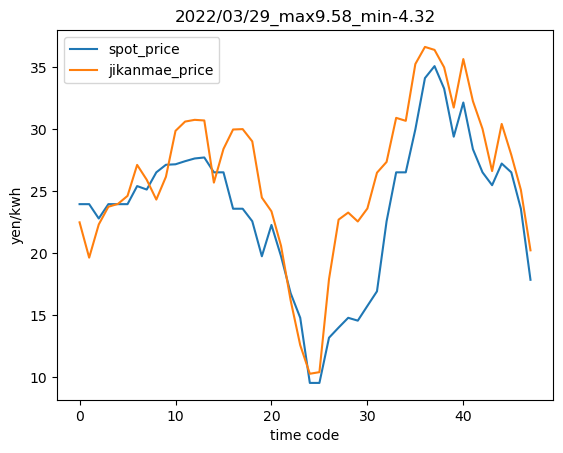

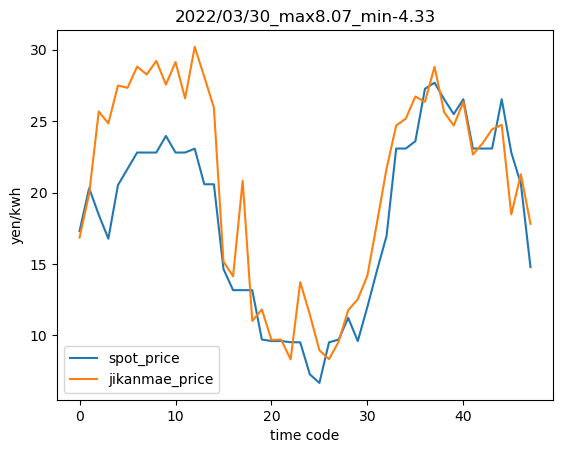

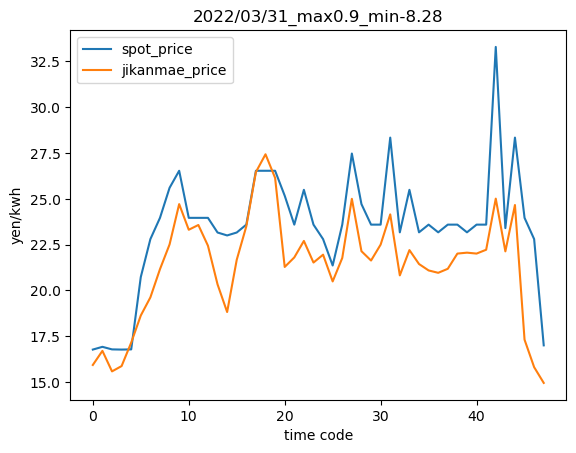

In [45]:
# 1日毎のスポット市場と時間前市場のグラフをプロットする

df_oneday = pd.DataFrame()
Date_list = df_merge['Date_x'].drop_duplicates().values

for oneday in Date_list[:]:
    df_oneday = pd.DataFrame()

    df_oneday = df_merge[df_merge['Date_x']==oneday].copy()
    range_list= np.array(list(range(len(df_oneday.copy()))))
    df_oneday['num'] = range_list
    gap_value = df_oneday['gap_price'].values
    min_gap = round(np.min(gap_value),2)
    max_gap = round(np.max(gap_value),2)



    df_oneday.plot(x='num' , y=['spot_price','jikanmae_price'],title=f'{oneday}_max{max_gap}_min{min_gap}',xlabel='time code',ylabel='yen/kwh')


    oneday_name_for_file = oneday.replace('/','_')
    plt.savefig(f'/Users/yusuke_miyazaki/Desktop/share_images/gap_jikanmae_spot_images/{year}_images/{oneday_name_for_file}_gap.png')
    plt.show()
    


In [39]:
oneday.replace('/','_')

'2022_11_04'

In [12]:
len(Date_list)

218

<AxesSubplot: title={'center': '2022/04/10'}, xlabel='time code', ylabel='yen/kwh'>

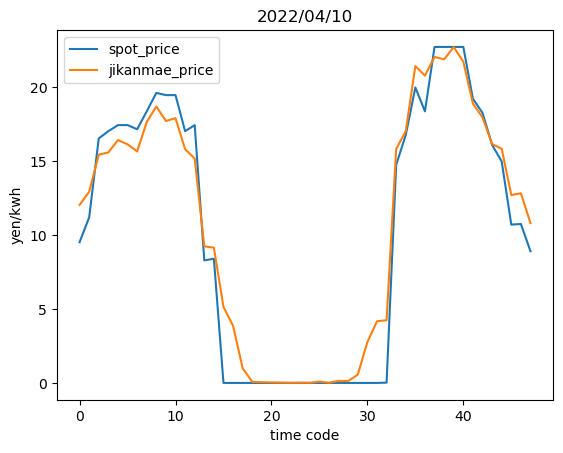

In [32]:


df_oneday.plot(x='num' , y=['spot_price','jikanmae_price'],title=f'{oneday}',xlabel='time code',ylabel='yen/kwh')

In [24]:
df_oneday

,Date_x,timecode_x,売り入札量(kWh),買い入札量(kWh),volume_spot,spot_price,エリアプライス北海道(円/kWh),エリアプライス東北(円/kWh),エリアプライス東京(円/kWh),エリアプライス中部(円/kWh),...,timecode_y,始値（円/kWh）,高値（円/kWh）,安値（円/kWh）,終値（円/kWh）,jikanmae_price,volume_jikanmae,約定件数,gap_price,num
432,2022/04/10,1,16168750,14191600,13295700,9.53,9.53,9.53,9.53,9.53,...,1,10.53,16.00,5.40,11.48,12.05,221.3,53,2.52,0
433,2022/04/10,2,17408100,14580950,13327700,11.21,11.31,11.31,11.31,11.31,...,2,12.31,16.00,3.00,6.06,12.94,322.0,59,1.73,1
434,2022/04/10,3,18277150,14833750,13320550,16.55,16.74,16.74,16.74,16.74,...,3,16.74,17.49,6.06,15.56,15.45,228.7,51,-1.10,2
435,2022/04/10,4,18441250,15016050,13365500,17.04,17.04,17.04,17.04,17.04,...,4,17.04,18.04,6.06,18.04,15.60,475.9,66,-1.44,3
436,2022/04/10,5,18650550,15195800,13397800,17.45,18.30,18.30,18.30,18.30,...,5,18.30,19.05,7.93,15.00,16.44,294.2,53,-1.01,4
437,2022/04/10,6,18756050,15518600,13652000,17.45,17.45,17.45,17.45,17.45,...,6,17.45,18.35,9.00,15.00,16.15,299.7,54,-1.30,5
438,2022/04/10,7,18630400,15478450,13603250,17.17,17.17,17.17,17.17,17.17,...,7,17.17,17.99,10.60,17.99,15.67,305.2,56,-1.50,6
439,2022/04/10,8,18467000,15647700,13553000,18.38,19.48,19.48,19.48,19.48,...,8,19.48,19.90,9.00,19.38,17.66,352.3,56,-0.72,7
440,2022/04/10,9,18486100,15749400,13540350,19.63,20.25,20.25,20.25,20.25,...,9,20.25,20.60,10.60,20.15,18.71,417.4,64,-0.92,8
441,2022/04/10,10,18382700,15425750,13277950,19.48,19.63,19.63,19.63,19.63,...,10,19.63,20.00,10.60,19.53,17.73,382.3,53,-1.75,9
